In [1]:
import os
import numpy as np
import pandas as pd
from tifffile import imread
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm.notebook import tqdm

In [2]:
base_path = '/home/unix/jiahao/wanglab/Data/Analyzed/2024-01-08-Jiakun-MouseSpleen64Gene/'
# base_path = 'Z:/Data/Analyzed/2024-01-08-Jiakun-MouseSpleen64Gene/'
dapi_path = os.path.join(base_path, 'images/flamingo/DAPI_MAX')
ref_merged_path = os.path.join(base_path, 'images/ref_merged_MAX')
signal_path = os.path.join(base_path, 'signal')
output_path = os.path.join(base_path, "output")
if not os.path.exists(output_path):
    os.makedirs(output_path)

In [60]:
position_list = [15, 115, 132, 
                 268, 273, 326, 
                 539, 538, 582,
                 797, 838, 840,
                 1046, 1062, 1141,
                 1276, 1299, 1352]

In [64]:
for i in tqdm(position_list):
    current_position = f"Position{i:03d}"
    print(current_position)

    current_dapi_img = imread(os.path.join(dapi_path, current_position + '.tif'))
    current_ref_merged_img = imread(os.path.join(ref_merged_path, current_position + '.tif'))
    current_signal = pd.read_csv(os.path.join(signal_path, current_position + '_goodSpots.csv'))
    current_signal['x'] = current_signal['x'] - 1
    current_signal['y'] = current_signal['y'] - 1
    current_signal['z'] = current_signal['z'] - 1

    top_genes_counts = pd.DataFrame(current_signal.value_counts('gene'))
    top_genes_counts.columns = ['counts']
    top_genes = top_genes_counts.index[:10]
    
    # ref_merged
    current_spots = current_signal[current_signal['gene'].isin(top_genes)]
    fig, ax = plt.subplots(figsize=(30, 30))
    ax.imshow(current_ref_merged_img, cmap='gray')
    sns.scatterplot(data=current_spots, x='x', y='y', hue='gene', size=1, linewidth=0)
    plt.axis('off')
    plt.tight_layout()
    plt.savefig(os.path.join(output_path, current_position + '_ref_merged.tif'))
    plt.clf()
    plt.close()
    # plt.show()

    # dapi
    current_spots = current_signal[current_signal['gene'].isin(top_genes)]
    fig, ax = plt.subplots(figsize=(30, 30))
    ax.imshow(current_dapi_img, cmap='gray')
    sns.scatterplot(data=current_spots, x='x', y='y', hue='gene', size=1, linewidth=0)
    plt.axis('off')
    plt.tight_layout()
    plt.savefig(os.path.join(output_path, current_position + '_dapi.tif'))
    plt.clf()
    plt.close()

  0%|          | 0/18 [00:00<?, ?it/s]

Position015
Position115
Position132
Position268
Position273
Position326
Position539
Position538
Position582
Position797
Position838
Position840
Position1046
Position1062
Position1141
Position1276
Position1299
Position1352


In [17]:
current_sample = 'sample3'
current_dapi_img = imread(os.path.join(base_path, "images/fused/2D", current_sample, "DAPI.tif"))
current_signal = pd.read_csv(os.path.join(signal_path, current_sample + '_goodSpots.csv'))
current_signal['x'] = current_signal['x'] - 1
current_signal['y'] = current_signal['y'] - 1
current_signal['z'] = current_signal['z'] - 1

In [20]:

all_genes = sorted(current_signal.gene.unique())
for current_gene in tqdm(all_genes):
    # current_gene = 'Cd68'
    current_spots = current_signal[current_signal['gene'] == current_gene]
    n_spots = current_spots.shape[0]
    fig, ax = plt.subplots(figsize=(40, 40))
    ax.imshow(current_dapi_img, cmap='gray')
    # sns.scatterplot(data=current_spots, x='x', y='y', color='red', size=1, linewidth=0)
    ax.plot(current_spots['x'], current_spots['y'], 'r.', markersize=3)
    ax.set_facecolor('k')
    plt.axis('off')
    plt.tight_layout()
    # plt.savefig(os.path.join(output_path, f'{current_sample}_{current_gene}_{n_spots}.tif'), pil_kwargs={"compression": "tiff_lzw"})
    plt.savefig(os.path.join(output_path, f'{current_sample}_{current_gene}_{n_spots}.png'))
    plt.clf()
    plt.close()
    # plt.show()

  0%|          | 0/64 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [38]:
current_position = "Position268"
current_dapi_img = imread(os.path.join(dapi_path, current_position + '.tif'))
current_ref_merged_img = imread(os.path.join(ref_merged_path, current_position + '.tif'))
current_signal = pd.read_csv(os.path.join(signal_path, current_position + '_goodSpots.csv'))
current_signal['x'] = current_signal['x'] - 1
current_signal['y'] = current_signal['y'] - 1
current_signal['z'] = current_signal['z'] - 1

In [39]:
top_genes_counts = pd.DataFrame(current_signal.value_counts('gene'))
top_genes_counts.columns = ['counts']
top_genes = top_genes_counts.index[:10]
top_genes

Index(['Cd19', 'Cd22', 'Xcr1', 'H2-K1', 'Lmo2', 'Cd3d', 'Tcf3', 'Cd79a',
       'Cd3g', 'Ikzf1'],
      dtype='object', name='gene')

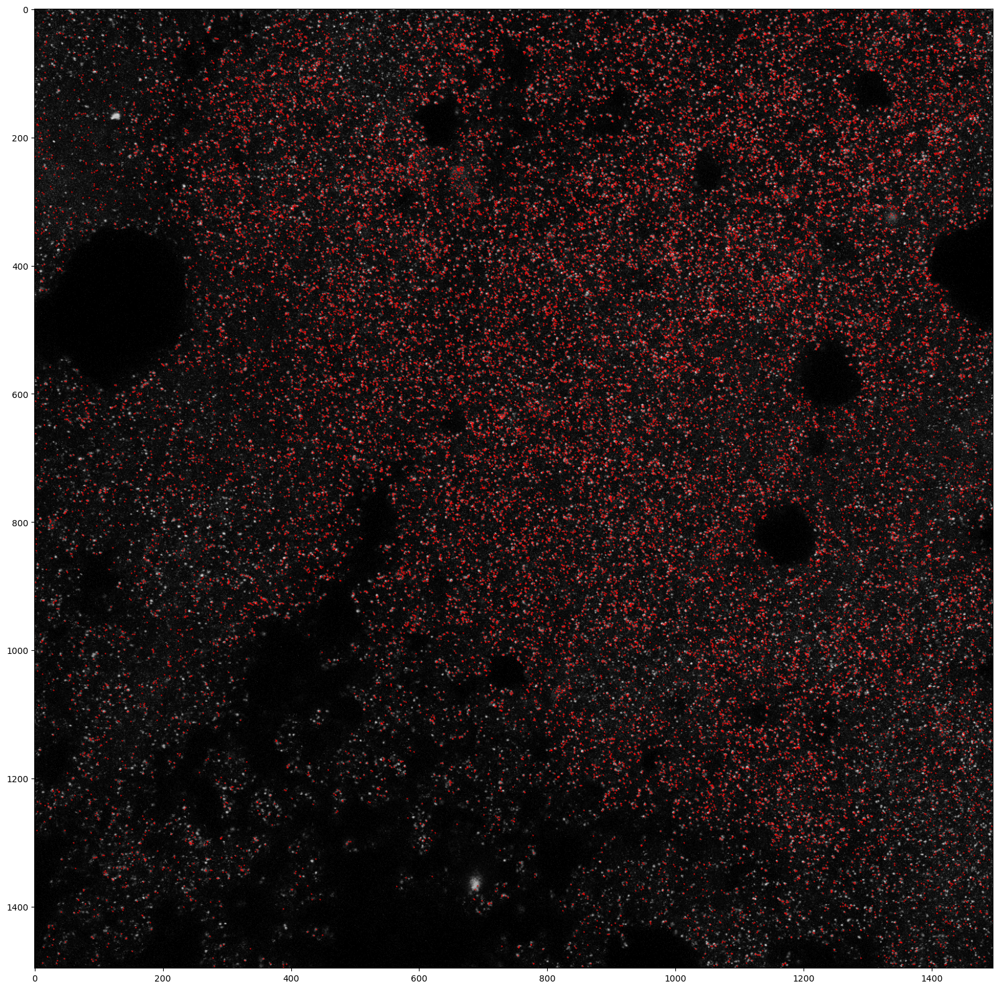

In [43]:
fig, ax = plt.subplots(figsize=(20, 20))
ax.imshow(current_ref_merged_img, cmap='gray')
# ax.imshow(current_dapi_img, cmap='gray')
ax.plot(current_signal['x'], current_signal['y'], 'r.', markersize=1)
plt.show()

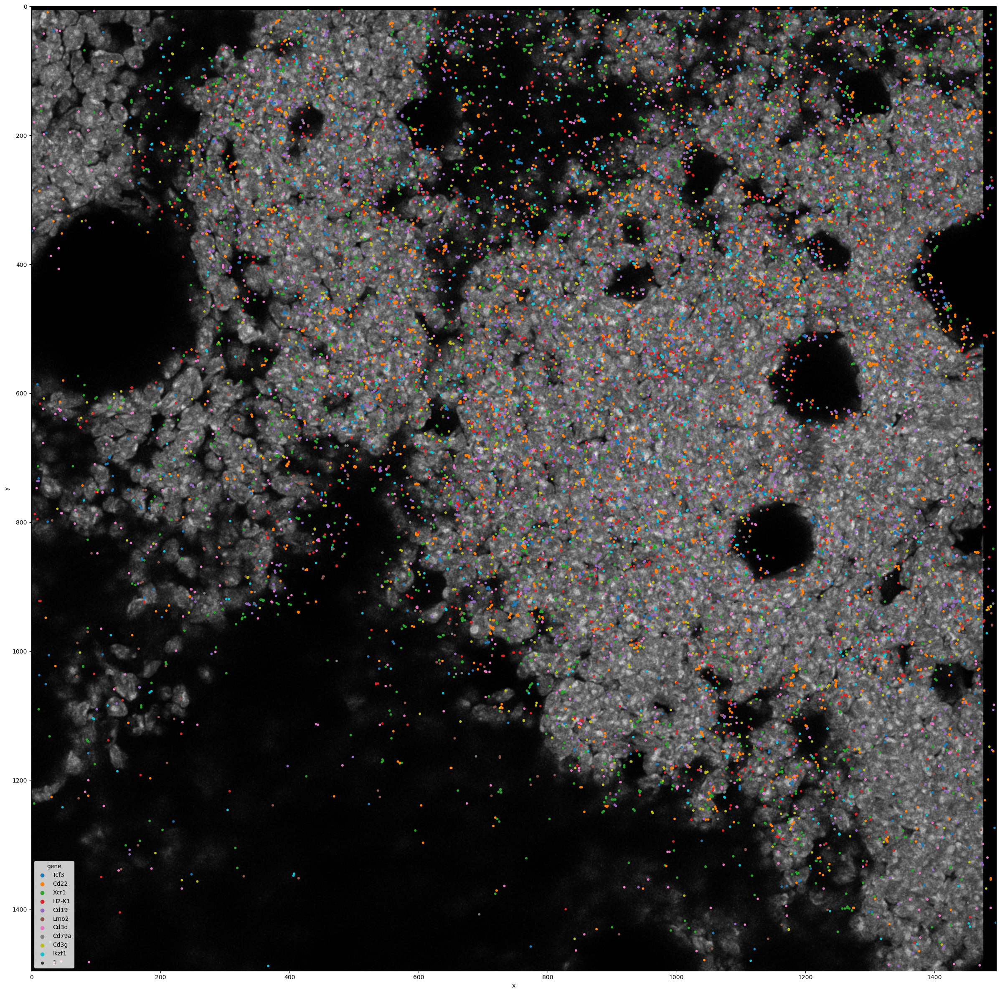

In [52]:
current_spots = current_signal[current_signal['gene'].isin(top_genes)]
fig, ax = plt.subplots(figsize=(30, 30))
ax.imshow(current_ref_merged_img, cmap='gray')
# ax.imshow(current_dapi_img, cmap='gray')
sns.scatterplot(data=current_spots, x='x', y='y', hue='gene', size=1, linewidth=0)
plt.show()

In [1]:
import os
import pandas as pd
from tifffile import imread
import matplotlib.pyplot as plt
current_sample = 'Position655'
base_path = '/home/unix/jiahao/wanglab/Data/Analyzed/2024-01-08-Jiakun-MouseSpleen64Gene/'
signal_path = os.path.join(base_path, 'signal')
output_path = os.path.join(base_path, "output")
if not os.path.exists(output_path):
    os.makedirs(output_path)


current_dapi_img = imread(os.path.join(base_path, "images/flamingo/DAPI_MAX", "Position655.tif"))
current_signal = pd.read_csv(os.path.join(signal_path, current_sample + '_goodSpots.csv'))
current_signal['x'] = current_signal['x'] - 1
current_signal['y'] = current_signal['y'] - 1
current_signal['z'] = current_signal['z'] - 1
all_genes = sorted(current_signal.gene.unique())

for gene in all_genes:
    current_spots = current_signal[current_signal['gene'] == gene]
    n_spots = current_spots.shape[0]
    fig, ax = plt.subplots(figsize=(20, 20))
    ax.imshow(current_dapi_img, cmap='gray')
    ax.plot(current_spots['x'], current_spots['y'], 'r.', markersize=3)
    plt.axis('off')
    plt.tight_layout()
    plt.savefig(os.path.join(output_path, f'{gene}_{n_spots}.tif'))
    plt.clf()
    plt.close()